In [3]:
using Pkg
Pkg.add("Images")

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
   Installed ImageMagick ───── v1.2.2
   Installed ImageMagick_jll ─ v6.9.10-12+3
    Updating `~/.julia/environments/v1.8/Project.toml`
  [916415d5] + Images v0.25.2
    Updating `~/.julia/environments/v1.8/Manifest.toml`
  [ec485272] + ArnoldiMethod v0.2.0
  [13072b0f] + AxisAlgorithms v1.0.1
  [39de3d68] + AxisArrays v0.4.6
  [aafaddc9] + CatIndices v0.2.2
  [aaaa29a8] + Clustering v0.14.3
  [ed09eef8] + ComputationalResources v0.3.2
  [150eb455] + CoordinateTransformations v0.6.2
  [dc8bdbbb] + CustomUnitRanges v1.0.2
  [b4f34e82] + Distances v0.10.7
  [4f61f5a4] + FFTViews v0.3.2
  [7a1cc6ca] + FFTW v1.5.0
  [a2bd30eb] + Graphics v1.1.2
  [86223c79] + Graphs v1.7.4
  [2803e5a7] + ImageAxes v0.6.10
  [c817782e] + ImageBase v0.1.5
  [f332f351] + ImageContrastAdjustment v0.3.10
  [a09fc81d] + ImageCore v0.9.4
  [51556ac3] + ImageDistances v0.2.16
  [6a3955dd] + ImageFiltering v0.7.2
  [82e4d7

In [1]:
using LinearAlgebra
using SparseArrays
using Images
using MAT

<img src="https://raw.githubusercontent.com/JuliaAcademy/DataScience/201f2e66cf2067dacee2df02b546f75d77ed22e7/data/matrix_storage.png">

In [2]:
A = rand(10, 10);
A_transpose = A'
A = A * A_transpose

10×10 Matrix{Float64}:
 4.06578  3.17534  3.01734  2.07807  …  3.14652  3.85183  2.87177  2.46883
 3.17534  3.50431  2.95776  1.92843     2.85075  3.29764  3.25708  2.25826
 3.01734  2.95776  3.21266  1.69188     2.8537   2.92473  2.88375  1.93918
 2.07807  1.92843  1.69188  1.86392     2.20584  2.44329  2.01174  1.91184
 2.49607  1.68688  1.7054   1.15916     1.68894  2.16835  1.35981  1.71879
 3.32031  2.59893  3.06494  1.8042   …  2.68518  3.61424  2.41165  1.99815
 3.14652  2.85075  2.8537   2.20584     4.05676  3.30605  3.32425  2.96265
 3.85183  3.29764  2.92473  2.44329     3.30605  4.46072  3.18323  2.88025
 2.87177  3.25708  2.88375  2.01174     3.32425  3.18323  3.52906  2.53339
 2.46883  2.25826  1.93918  1.91184     2.96265  2.88025  2.53339  2.63971

In [3]:
@show A[11] == A[1, 2]

A[11] == A[1, 2] = true


true

In [4]:
b = rand(10)
x = A\b
@show norm(A*x-b)

norm(A * x - b) = 3.192090643545905e-13


3.192090643545905e-13

In [6]:
@show typeof(A)
@show typeof(b)
@show typeof(rand(1, 10))
@show typeof(A_transpose)
;

typeof(A) = Matrix{Float64}
typeof(b) = Vector{Float64}
typeof(rand(1, 10)) = Matrix{Float64}
typeof(A_transpose) = Adjoint{Float64, Matrix{Float64}}


In [8]:
Matrix{Float64} == Array{Float64, 2}

true

In [10]:
Vector{Float64} == Array{Float64, 1}

true

In [11]:
?adjoint

search: adjoint adjoint! Adjoint



```
A'
adjoint(A)
```

Lazy adjoint (conjugate transposition). Note that `adjoint` is applied recursively to elements.

For number types, `adjoint` returns the complex conjugate, and therefore it is equivalent to the identity function for real numbers.

This operation is intended for linear algebra usage - for general data manipulation see [`permutedims`](@ref Base.permutedims).

# Examples

```jldoctest
julia> A = [3+2im 9+2im; 8+7im  4+6im]
2×2 Matrix{Complex{Int64}}:
 3+2im  9+2im
 8+7im  4+6im

julia> adjoint(A)
2×2 adjoint(::Matrix{Complex{Int64}}) with eltype Complex{Int64}:
 3-2im  8-7im
 9-2im  4-6im

julia> x = [3, 4im]
2-element Vector{Complex{Int64}}:
 3 + 0im
 0 + 4im

julia> x'x
25 + 0im
```


In [12]:
A_transpose.parent == A_transpose'

true

# 🟢 Factorization

LU Factorization
$$
L * U = P * A
$$

In [13]:
luA = lu(A)

LU{Float64, Matrix{Float64}, Vector{Int64}}
L factor:
10×10 Matrix{Float64}:
 1.0        0.0          0.0        …  0.0       0.0       0.0       0.0
 0.780991   1.0          0.0           0.0       0.0       0.0       0.0
 0.74213    0.586931     1.0           0.0       0.0       0.0       0.0
 0.511112   0.298197    -0.0477202     0.0       0.0       0.0       0.0
 0.613921  -0.256277     0.0114034     0.0       0.0       0.0       0.0
 0.816649   0.00566153   0.962804   …  0.0       0.0       0.0       0.0
 0.773903   0.38398      0.463657      1.0       0.0       0.0       0.0
 0.947379   0.282498    -0.167098      0.219344  1.0       0.0       0.0
 0.706328   0.990087     0.253383      0.443803  0.989933  1.0       0.0
 0.607221   0.322264    -0.139845      0.729989  0.380995  0.505461  1.0
U factor:
10×10 Matrix{Float64}:
 4.06578  3.17534  3.01734   …   3.85183     2.87177     2.46883
 0.0      1.0244   0.601252      0.289391    1.01425     0.330127
 0.0      0.0      0.62051   

In [14]:
norm(luA.L * luA.U - luA.P * A)

1.8038988979531736e-15

QR Factorization
$$
Q * R = A
$$

In [15]:
qrA = qr(A)

LinearAlgebra.QRCompactWY{Float64, Matrix{Float64}, Matrix{Float64}}
Q factor:
10×10 LinearAlgebra.QRCompactWYQ{Float64, Matrix{Float64}, Matrix{Float64}}:
 -0.414164   0.364946    0.219548     …   0.00882426  -0.327599    0.209416
 -0.323458  -0.510014    0.211811         0.597308     0.0782391  -0.15717
 -0.307363  -0.195792   -0.582053        -0.146367     0.324953    0.532668
 -0.211684  -0.050548    0.160926         0.0626749   -0.0192971  -0.12926
 -0.254264   0.427797    0.11568         -0.134325     0.121059   -0.303544
 -0.338226   0.293532   -0.560553     …   0.18353     -0.350812   -0.248304
 -0.320523  -0.0228441  -0.170997         0.220836     0.315502   -0.294856
 -0.39237    0.121147    0.347836        -0.318662     0.518403    0.0661825
 -0.292536  -0.52938     0.000251432     -0.621654    -0.388222   -0.280227
 -0.251489  -0.0346073   0.253811         0.171169    -0.351946    0.554399
R factor:
10×10 Matrix{Float64}:
 -9.81684  -8.80224  -8.41578   -6.03898   …  -8.700

In [16]:
norm(qrA.Q * qrA.R - A)

7.984348558471944e-15

Cholesky factorization

Note: $A$ should be symmetric

$$L * L' = A$$

In [17]:
isposdef(A)

true

In [18]:
cholA = cholesky(A)

Cholesky{Float64, Matrix{Float64}}
U factor:
10×10 UpperTriangular{Float64, Matrix{Float64}}:
 2.01638  1.57477  1.49641    1.0306     …   1.91027    1.42422    1.22439
  ⋅       1.01213  0.594048   0.301813       0.285923   1.00209    0.326172
  ⋅        ⋅       0.787725  -0.0375904     -0.131627   0.199596  -0.110159
  ⋅        ⋅        ⋅         0.842194       0.455159   0.29565    0.649983
  ⋅        ⋅        ⋅          ⋅            -0.106277  -0.139339   0.33633
  ⋅        ⋅        ⋅          ⋅         …   0.60391   -0.195121   0.00375574
  ⋅        ⋅        ⋅          ⋅             0.203401   0.411546   0.676931
  ⋅        ⋅        ⋅          ⋅             0.296579   0.293594   0.112995
  ⋅        ⋅        ⋅          ⋅              ⋅         0.236966   0.119777
  ⋅        ⋅        ⋅          ⋅              ⋅          ⋅         0.0331566

In [19]:
norm(cholA.L * cholA.U - A)

1.9984014443252818e-15

In [20]:
factorize(A)

Cholesky{Float64, Matrix{Float64}}
U factor:
10×10 UpperTriangular{Float64, Matrix{Float64}}:
 2.01638  1.57477  1.49641    1.0306     …   1.91027    1.42422    1.22439
  ⋅       1.01213  0.594048   0.301813       0.285923   1.00209    0.326172
  ⋅        ⋅       0.787725  -0.0375904     -0.131627   0.199596  -0.110159
  ⋅        ⋅        ⋅         0.842194       0.455159   0.29565    0.649983
  ⋅        ⋅        ⋅          ⋅            -0.106277  -0.139339   0.33633
  ⋅        ⋅        ⋅          ⋅         …   0.60391   -0.195121   0.00375574
  ⋅        ⋅        ⋅          ⋅             0.203401   0.411546   0.676931
  ⋅        ⋅        ⋅          ⋅             0.296579   0.293594   0.112995
  ⋅        ⋅        ⋅          ⋅              ⋅         0.236966   0.119777
  ⋅        ⋅        ⋅          ⋅              ⋅          ⋅         0.0331566

In [21]:
?factorize

search: factorize Factorization factorial



```
factorize(A)
```

Compute a convenient factorization of `A`, based upon the type of the input matrix. `factorize` checks `A` to see if it is symmetric/triangular/etc. if `A` is passed as a generic matrix. `factorize` checks every element of `A` to verify/rule out each property. It will short-circuit as soon as it can rule out symmetry/triangular structure. The return value can be reused for efficient solving of multiple systems. For example: `A=factorize(A); x=A\b; y=A\C`.

| Properties of `A`          | type of factorization                      |
|:-------------------------- |:------------------------------------------ |
| Positive-definite          | Cholesky (see [`cholesky`](@ref))          |
| Dense Symmetric/Hermitian  | Bunch-Kaufman (see [`bunchkaufman`](@ref)) |
| Sparse Symmetric/Hermitian | LDLt (see [`ldlt`](@ref))                  |
| Triangular                 | Triangular                                 |
| Diagonal                   | Diagonal                                   |
| Bidiagonal                 | Bidiagonal                                 |
| Tridiagonal                | LU (see [`lu`](@ref))                      |
| Symmetric real tridiagonal | LDLt (see [`ldlt`](@ref))                  |
| General square             | LU (see [`lu`](@ref))                      |
| General non-square         | QR (see [`qr`](@ref))                      |

If `factorize` is called on a Hermitian positive-definite matrix, for instance, then `factorize` will return a Cholesky factorization.

# Examples

```jldoctest
julia> A = Array(Bidiagonal(fill(1.0, (5, 5)), :U))
5×5 Matrix{Float64}:
 1.0  1.0  0.0  0.0  0.0
 0.0  1.0  1.0  0.0  0.0
 0.0  0.0  1.0  1.0  0.0
 0.0  0.0  0.0  1.0  1.0
 0.0  0.0  0.0  0.0  1.0

julia> factorize(A) # factorize will check to see that A is already factorized
5×5 Bidiagonal{Float64, Vector{Float64}}:
 1.0  1.0   ⋅    ⋅    ⋅
  ⋅   1.0  1.0   ⋅    ⋅
  ⋅    ⋅   1.0  1.0   ⋅
  ⋅    ⋅    ⋅   1.0  1.0
  ⋅    ⋅    ⋅    ⋅   1.0
```

This returns a `5×5 Bidiagonal{Float64}`, which can now be passed to other linear algebra functions (e.g. eigensolvers) which will use specialized methods for `Bidiagonal` types.


# 🟢Sparse Linear Algebra
Sparse matrices are stored in Compressed Sparse Colums (CSC) form

In [23]:
using SparseArrays
S = sprand(5, 5, 2/5)

5×5 SparseMatrixCSC{Float64, Int64} with 10 stored entries:
  ⋅    ⋅        0.435597   ⋅           ⋅ 
  ⋅    ⋅        0.791745  0.00192025  0.736447
  ⋅   0.824527   ⋅         ⋅           ⋅ 
  ⋅   0.286631   ⋅        0.887647    0.126369
  ⋅   0.5039     ⋅         ⋅          0.652607

In [24]:
S.rowval

10-element Vector{Int64}:
 3
 4
 5
 1
 2
 2
 4
 2
 4
 5

In [25]:
Matrix(S)

5×5 Matrix{Float64}:
 0.0  0.0       0.435597  0.0         0.0
 0.0  0.0       0.791745  0.00192025  0.736447
 0.0  0.824527  0.0       0.0         0.0
 0.0  0.286631  0.0       0.887647    0.126369
 0.0  0.5039    0.0       0.0         0.652607

In [26]:
S.colptr

6-element Vector{Int64}:
  1
  1
  4
  6
  8
 11

In [27]:
S.m

5

# 🟢Images as matrices

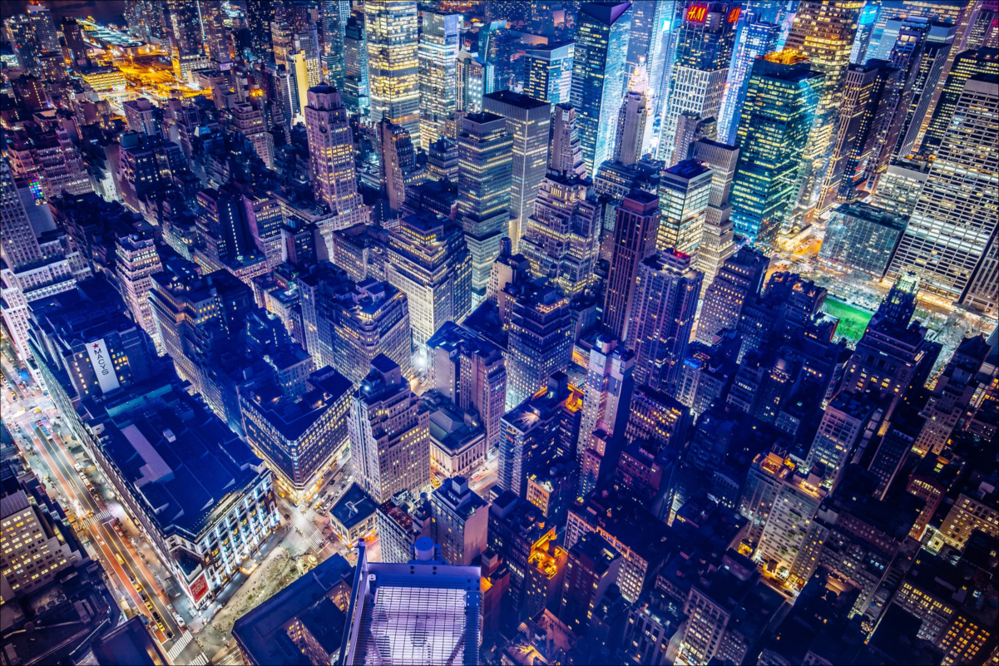

In [40]:
img = load("./data/denys-nevozhai-2vmT5_FeMck-unsplash.jpg")

In [41]:
img[20, 30]

In [42]:
@show typeof(img)

typeof(img) = Matrix{RGB{N0f8}}


Matrix{RGB{N0f8}} (alias for Array{RGB{Normed{UInt8, 8}}, 2})

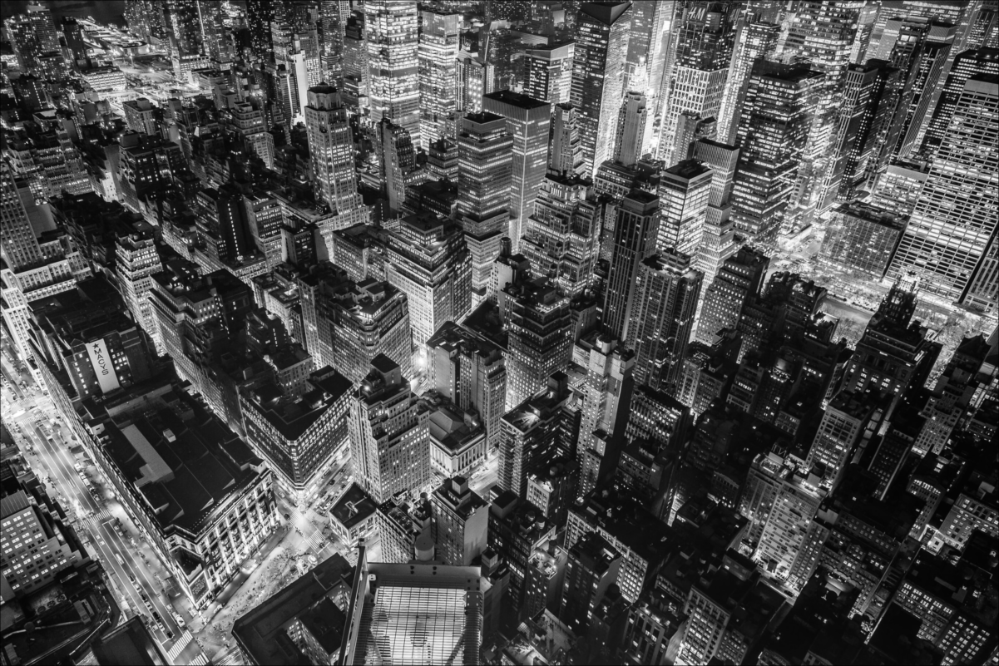

In [43]:
img_gray = Gray.(img)

Separate RGB channels from the image

In [44]:
R = map(i->img[i].r, 1:length(img))
R = Float64.(reshape(R, size(img)...))

G = map(i->img[i].g, 1:length(img))
G = Float64.(reshape(G, size(img)...))

B = map(i->img[i].b, 1:length(img))
B = Float64.(reshape(B, size(img)...))
;

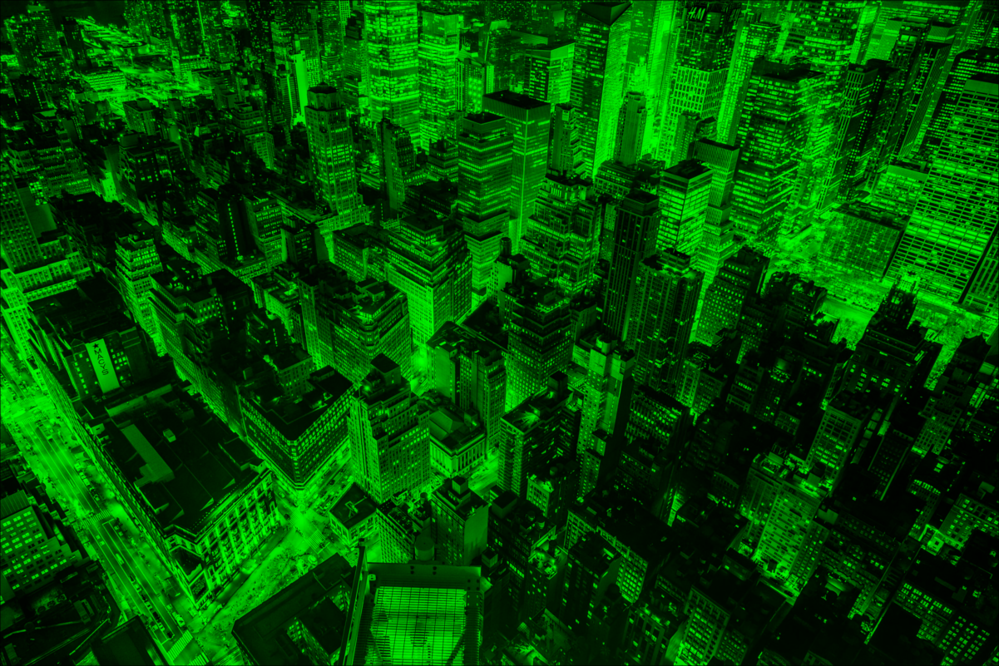

In [45]:
Z = zeros(size(R)...)
RGB.(Z, G, Z)

In [46]:
img_gray_values = Float64.(img_gray)

1600×2400 Matrix{Float64}:
 0.0941176  0.0901961  0.0862745  …  0.247059   0.235294  0.164706
 0.0901961  0.0862745  0.0862745     0.223529   0.203922  0.14902
 0.0862745  0.0823529  0.0823529     0.196078   0.172549  0.14902
 0.0862745  0.0823529  0.0784314     0.176471   0.156863  0.168627
 0.0980392  0.0901961  0.0823529     0.156863   0.137255  0.180392
 0.105882   0.101961   0.0941176  …  0.133333   0.117647  0.180392
 0.101961   0.0941176  0.0862745     0.117647   0.109804  0.180392
 0.0901961  0.0823529  0.0745098     0.109804   0.109804  0.188235
 0.0980392  0.0980392  0.0980392     0.0705882  0.172549  0.262745
 0.0980392  0.0941176  0.0941176     0.0784314  0.176471  0.231373
 0.0941176  0.0901961  0.0901961  …  0.129412   0.203922  0.196078
 0.0901961  0.0901961  0.0862745     0.156863   0.188235  0.141176
 0.0862745  0.0901961  0.0901961     0.184314   0.188235  0.156863
 ⋮                                ⋱                       
 0.160784   0.0862745  0.027451      0.85098 

In [47]:
SVD_v = svd(img_gray_values)

SVD{Float64, Float64, Matrix{Float64}, Vector{Float64}}
U factor:
1600×1600 Matrix{Float64}:
 0.0241707   0.00270527  0.0214443   …   0.00754695    0.000167816
 0.0237407   0.00491337  0.017555       -0.0140534     0.00372587
 0.0236072   0.00798596  0.0133816       0.0196394    -0.00912033
 0.0235682   0.00829791  0.0124311      -0.0191767     0.0120206
 0.0234303   0.0098261   0.0129305       0.0219291    -0.0120342
 0.0229268   0.0138269   0.0111341   …  -0.0130641     0.00949887
 0.022793    0.015304    0.0116268       0.00178621   -0.00601836
 0.0234167   0.0159506   0.0102526       0.0044472     0.00463945
 0.0241292   0.0179815   0.0119994       0.000159391  -0.0029255
 0.024497    0.0194817   0.0134566       0.0018397     0.00296734
 0.0243384   0.0189553   0.0115869   …  -0.00499149    0.000231741
 0.0241162   0.0179155   0.0100423       0.0128854    -0.00873772
 0.0248239   0.0159962   0.00962573     -0.0198286     0.00594486
 ⋮                                   ⋱            

In [48]:
norm(SVD_v.U * diagm(SVD_v.S) * SVD_v.V' - img_gray_values)

2.2154507565812802e-12

In [49]:
u1 = SVD_v.U[:, 1]
v1 = SVD_v.V[:, 1]
img1 = SVD_v.S[1] * u1 * v1'

i = 2
u1 = SVD_v.U[:, i]
v1 = SVD_v.V[:, i]
img1 += SVD_v.S[i] * u1 * v1'

i = 3
u1 = SVD_v.U[:, i]
v1 = SVD_v.V[:, i]
img1 += SVD_v.S[i] * u1 * v1'

i = 4
u1 = SVD_v.U[:, i]
v1 = SVD_v.V[:, i]
img1 += SVD_v.S[i] * u1 * v1'

1600×2400 Matrix{Float64}:
 0.278189  0.261999  0.254167  0.250578  …  0.245564  0.253184  0.250534
 0.265986  0.251027  0.243985  0.24037      0.24776   0.254969  0.252682
 0.265838  0.251776  0.245299  0.241681     0.258323  0.265483  0.263229
 0.266708  0.252869  0.246491  0.242924     0.259178  0.266292  0.264059
 0.256537  0.242662  0.236489  0.232638     0.262876  0.270047  0.267851
 0.23376   0.220599  0.215243  0.210933  …  0.27102   0.27806   0.276108
 0.19962   0.187003  0.182437  0.177533     0.269047  0.27555   0.274359
 0.219785  0.206929  0.202093  0.197335     0.27996   0.286823  0.285304
 0.229289  0.215407  0.210205  0.205095     0.296573  0.304125  0.302159
 0.223704  0.20934   0.204144  0.198635     0.304998  0.312788  0.310798
 0.229451  0.215556  0.210432  0.205207  …  0.302066  0.309698  0.30773
 0.230676  0.217328  0.212332  0.207376     0.295586  0.302919  0.301111
 0.246348  0.232847  0.227531  0.222832     0.295242  0.302551  0.300768
 ⋮                       

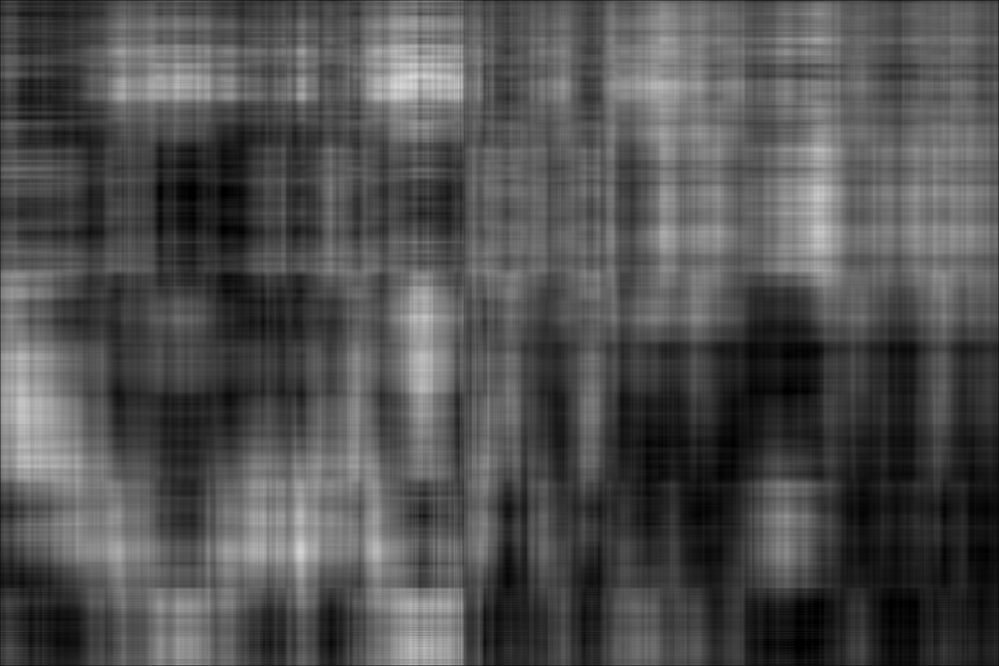

In [50]:
Gray.(img1)

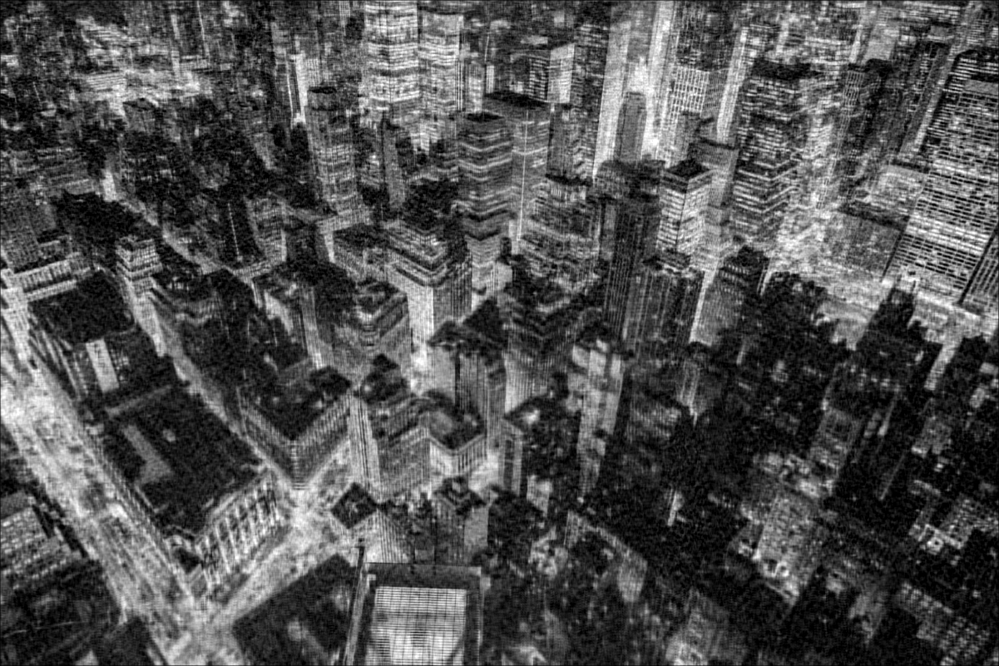

In [51]:
i = 1:100
u1 = SVD_v.U[:, i]
v1 = SVD_v.V[:, i]
img1 = u1 * spdiagm(0=>SVD_v.S[i]) * v1'
Gray.(img1)

In [52]:
norm(img_gray_values - img1)

248.1457417302729

Simple Facial Recognition Problem

In [53]:
M = matread("./data/face_recog_qr.mat")

Dict{String, Any} with 1 entry:
  "V2" => [0.08103 0.0729089 … 0.0529805 0.0594823; 0.089725 0.082329 … 0.05180…

Each vector in `M["V2"]` is a false image.

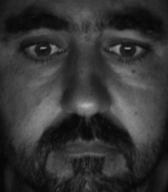

In [59]:
q = reshape(M["V2"][:, 1], 192, 168)
y1 = Gray.(q)

Now we will go back to the vectorized version of the image, and try to select the images that are most similar to it from the "dictionary" matrix. Let's use `b = q[:]` to be the query image. Note that the notation `[:]` vectorizes a matrix column wise.

In [56]:
b = q[:]

32256-element Vector{Float64}:
 0.0810300261581645
 0.08972497847335578
 0.0873803822279144
 0.0841839709221837
 0.08923537113064388
 0.08721125794763387
 0.09061926007535659
 0.09874041385097843
 0.08932030421406685
 0.08584587638761629
 0.09319940629980634
 0.08927783767235538
 0.0994655711726987
 ⋮
 0.10334467325843819
 0.09275226549880594
 0.0846311117231841
 0.07561567634556146
 0.06385097046320852
 0.06110169995847822
 0.05023127567812609
 0.03478055114733056
 0.027342088151717514
 0.028961527075438608
 0.024761941927267744
 0.027064071630997635

We will remove the first image from the dictionary. The goal is to find the solution of the linear system $Ax = b$ where $A$ is the dictionary of all the images. In face recognition problem, we really want to minimize the the norm difference `norm(Ax-b)` but the `\` actually solves a least squares problem when the matrix at hand is not invertible.

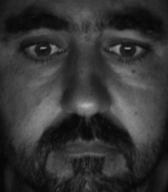

In [58]:
A = M["V2"][:, 2:end]
x = A \ b
y = Gray.(reshape(A * x, 192, 168))

In [60]:
y == y1

false

In [61]:
norm(A * x - b)

2.124981879105225e-14

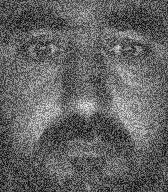

In [62]:
qv = q + rand(size(q, 1), size(q, 2)) * 0.5
qv = qv./maximum(qv)

Gray.(qv)

In [63]:
b = qv[:]

32256-element Vector{Float64}:
 0.40780308916617886
 0.32112924148816996
 0.261174933791584
 0.3416402541276059
 0.35961959285083117
 0.1954623600096721
 0.17120056640502626
 0.4736396162660395
 0.3334363791892279
 0.35156056668418034
 0.42247100322404874
 0.29458666296540037
 0.22257565161521825
 ⋮
 0.120027423899158
 0.25668990409676057
 0.2535520947563281
 0.283214852281416
 0.08610706297022344
 0.38867358946593944
 0.26000080433540296
 0.13175951384377904
 0.1545776783788809
 0.3354691251862889
 0.0256390687571327
 0.17071154283968026

In [64]:
x = A \ b
norm(A * x - b)

22.614975672609702

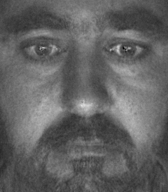

In [65]:
Gray.(reshape(A * x, 192, 168))